# Quick start: initializing, adding data, runing and saving your PyWGCNA

First, make sure to [install PyWGCNA](https://github.com/mortazavilab/PyWGCNA#readme).

I encourage you to look at [Data input, cleaning and pre-processing tutorial](Data%20format.md) before running PyWGCNA.

Then, download the example data from [here](https://github.com/mortazavilab/PyWGCNA/raw/main/tutorials/5xFAD_paper.zip) and decompress it.

For this tutorial, we will be using the gene expression matrix of 5xFAD mouse from the [MODEL-AD](https://www.model-ad.org/) project and [this paper](https://www.nature.com/articles/s41597-021-01054-y) in Scientific Data which has 5548 genes and 193 samples in four different time points.

## Setting up the PyWGCNA object

We use the TPM matrix to create a PyWGCNA object. The object serves as a container that contains expression data (i.e. TPM) and analysis results (like clustering, or visualizations) for an RNA-seq dataset. For a technical discussion of the PyWGCNA object structure, check out our [GitHub Wiki](https://github.com/mortazavilab/PyWGCNA/wiki). For example, the raw TPM matrix is stored in `GeneExp` class as an AnnData.

## **Note**

Depending on the amount of RAM on your machine, you may get an error during calculation of the TOM similarity matrix. In order to solve this problem, we suggest to remove one or two samples from each category or use another machine with more RAM.

**Compatible with PyWGCNA 2.0.0**

In [2]:
import PyWGCNA
#import pandas as pd

# X = pd.read_csv("/work/yhesse/PW_rawdata/tr_gc_mutual/tr_mut_transposed.csv", sep=",")

In [ ]:
xele= PyWGCNA.readWGCNA("/work/yhesse/jobs/xele_ml/wgcna/wgcnaxele.p")

In [3]:
geneExp = '/work/yhesse/PW_rawdata/tr_gc_mutual/tr_mut_transposed_modified.csv'
pyWGCNA_5xFAD = PyWGCNA.WGCNA(name='xele', 
                              species='xerophyta elegans', 
                              geneExpPath=geneExp, 
                              outputPath='',
                              save=True)
pyWGCNA_5xFAD.geneExpr.to_df().head(5)

Saving data to be True, checking requirements ...


,Xele.ptg000212l.1,Xele.ptg000045l.1,Xele.ptg000045l.2,Xele.ptg000045l.6,Xele.ptg000045l.7,Xele.ptg000045l.8,Xele.ptg000045l.9,Xele.ptg000045l.10,Xele.ptg000045l.11,Xele.ptg000045l.14,...,Xele.ptg000046l.351,Xele.ptg000046l.352,Xele.ptg000046l.354,Xele.ptg000046l.355,Xele.ptg000046l.356,Xele.ptg000046l.357,Xele.ptg000046l.358,Xele.ptg000046l.359,Xele.ptg000046l.360,Xele.ptg000046l.361
ref,,,,,,,,,,,,,,,,,,,,,
Xe_De_R2_T00,14.663031,5357.243210,130.396242,840.505899,1945.993721,18.852469,175.956375,432.035743,9.426234,159.722305,...,20.423508,3.665758,188.524688,57.604766,35.610219,5.760477,45.560133,909.631618,12.044633,39.799656
Xe_De_R2_T03,1.058997,2982.135634,169.439525,642.811197,1002.870187,83.660765,922.386412,1066.410008,41.300884,96.368730,...,22.238938,11.648967,93.191739,100.604718,46.595869,29.651917,163.085542,688.348069,9.530973,44.477875
Xe_De_R2_T06,51.595697,7718.187061,207.705754,783.196219,1496.275209,29.105265,470.976105,1113.937865,79.377995,112.452160,...,27.782298,6.614833,140.234458,56.887563,64.825363,47.626797,108.483260,807.009617,1.322967,30.428231
Xe_De_R2_T09,0.926446,5895.899871,170.465992,534.559118,394.665830,18.528912,522.515325,576.249170,25.014032,121.364375,...,33.352042,1.852891,119.511484,63.924747,38.910716,15.749575,114.879256,705.025110,12.043793,45.395835
Xe_De_R2_T12,8.743913,2162.244723,211.103038,574.599984,233.587385,7.494782,1435.250830,196.113473,26.231738,48.716086,...,37.473912,9.993043,118.667388,44.968694,27.480869,23.733478,6.245652,208.604777,8.743913,43.719564


## Pre-processing workflow

PyWGCNA allows you to easily preproces the data including removing genes with too many missing values or lowly-expressed genes across samples (by default we suggest to remove genes without that are expressed below 1 TPM) and removing samples with too many missing values. Keep in your mind that these options can be adjusted by changing `TPMcutoff` and `cut`

Pre-processing...
	Detecting genes and samples with too many missing values...
	Done pre-processing..



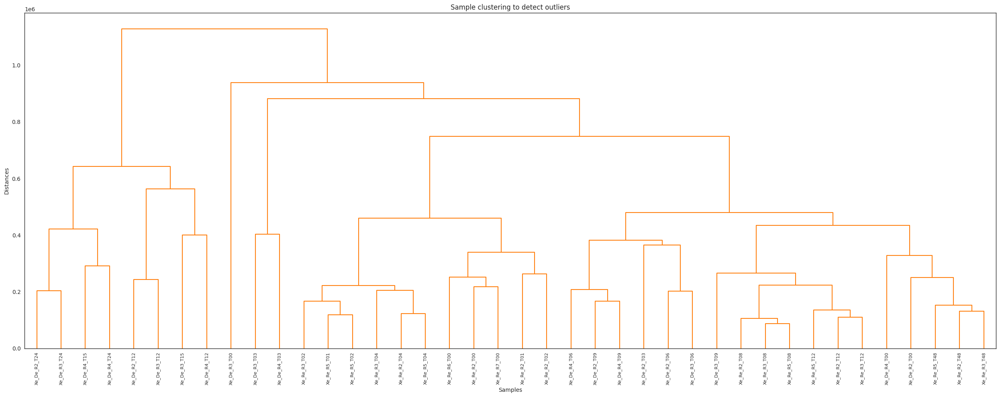

In [4]:
pyWGCNA_5xFAD.preprocess()

## Construction of the gene network and identification of modules

PyWGCNA compresses all the steps of network construction and module detection in one function called `findModules` which performs the following steps:
1. Choosing the soft-thresholding power: analysis of network topology
2. Co-expression similarity and adjacency
3. Topological Overlap Matrix (TOM)
4. Clustering using TOM
5. Merging of modules whose expression profiles are very similar

Run WGCNA...
pickSoftThreshold: calculating connectivity for given powers...
will use block size  1898
    Power  SFT.R.sq     slope truncated R.sq      mean(k)    median(k)  \
0       1  0.218622  1.244723       0.940913  3702.643741  3748.688668   
1       2  0.025439 -0.246248       0.780046  1729.033594  1717.649664   
2       3  0.254004 -0.763862        0.69714   964.419978   898.990234   
3       4  0.426255  -0.89756       0.685973   598.258311   512.939739   
4       5  0.625044 -0.962315       0.799323   398.724201   309.832416   
5       6  0.703128 -1.118852       0.848608   279.943881   195.059123   
6       7  0.784351 -1.191945       0.908254   204.502527   127.537684   
7       8  0.836089 -1.237229       0.943467   154.142239    86.148803   
8       9  0.873152 -1.266006       0.964284   119.168589    59.677637   
9      10  0.891462  -1.29876       0.975065     94.08466    42.099818   
10     11  0.893564 -1.342512       0.974856    75.604776    30.356205   
11     13

KeyboardInterrupt: 

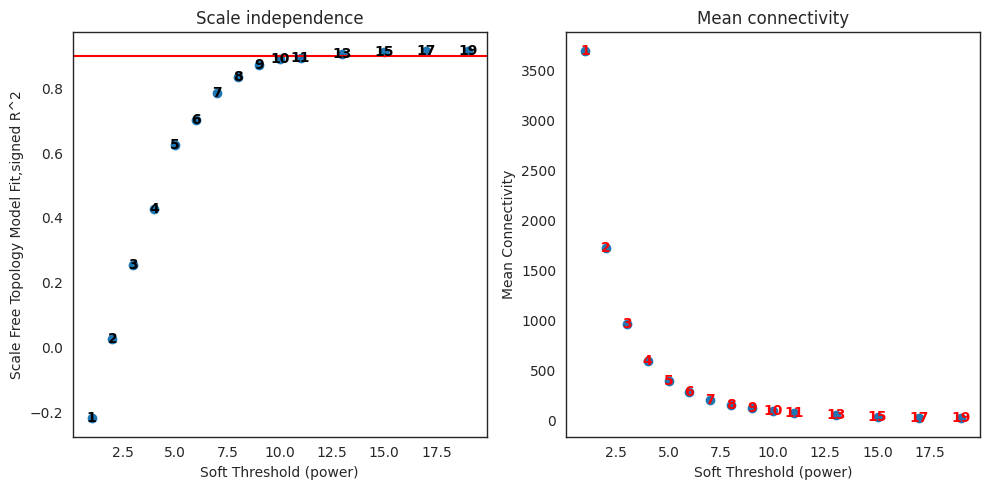

In [5]:
pyWGCNA_5xFAD.findModules()

In [7]:
pyWGCNA_5xFAD.getModuleName()

KeyError: 'moduleColors'

We also can merge two previous steps by calling `runWGCNA()` function.

### Updating sample information and assiging color to them for dowstream analysis

In [4]:
pyWGCNA_5xFAD.updateSampleInfo(path='5xFAD_paper/sampleInfo.csv', sep=',')

# add color for metadata
pyWGCNA_5xFAD.setMetadataColor('Sex', {'Female': 'green',
                                       'Male': 'yellow'})
pyWGCNA_5xFAD.setMetadataColor('Genotype', {'5xFADWT': 'darkviolet',
                                            '5xFADHEMI': 'deeppink'})
pyWGCNA_5xFAD.setMetadataColor('Age', {'4mon': 'thistle',
                                       '8mon': 'plum',
                                       '12mon': 'violet',
                                       '18mon': 'purple'})
pyWGCNA_5xFAD.setMetadataColor('Tissue', {'Hippocampus': 'red',
                                          'Cortex': 'blue'})

### Updating gene information

espcially adding gene name for doing downstream analysis

In [5]:
geneList = PyWGCNA.getGeneList(dataset='mmusculus_gene_ensembl',
                               attributes=['ensembl_gene_id', 
                                           'external_gene_name', 
                                           'gene_biotype'],
                               maps=['gene_id', 'gene_name', 'gene_biotype'])


pyWGCNA_5xFAD.updateGeneInfo(geneList)

**note**: For doing downstream analysis, we keep aside the Gray modules which is the collection of genes that could not be assigned to any other module.

## Relating modules to external information and identifying important genes
PyWGCNA gather some important analysis after identifying modules in `analyseWGCNA()` function including:

1. Quantifying module–trait relationship 
2. Gene relationship to trait and modules
3. Gene-ontology analysis

Keep in your mind before you start analysis to add any sample or gene information.

For showing module relationship heatmap, PyWGCNA needs user to choose and set colors from [Matplotlib colors](https://matplotlib.org/stable/gallery/color/named_colors.html) for metadata by using `setMetadataColor()` function.

You also can select which data trait in which order you wish to show in module eigengene heatmap

Analysing WGCNA...
Calculating module trait relationship ...
	Done..

Adding (signed) eigengene-based connectivity (module membership) ...
	Done..

plotting module heatmap eigengene...
	Done..

plotting module barplot eigengene...
	Done..

doing Enrichr GO analysis for each module...
	Done..



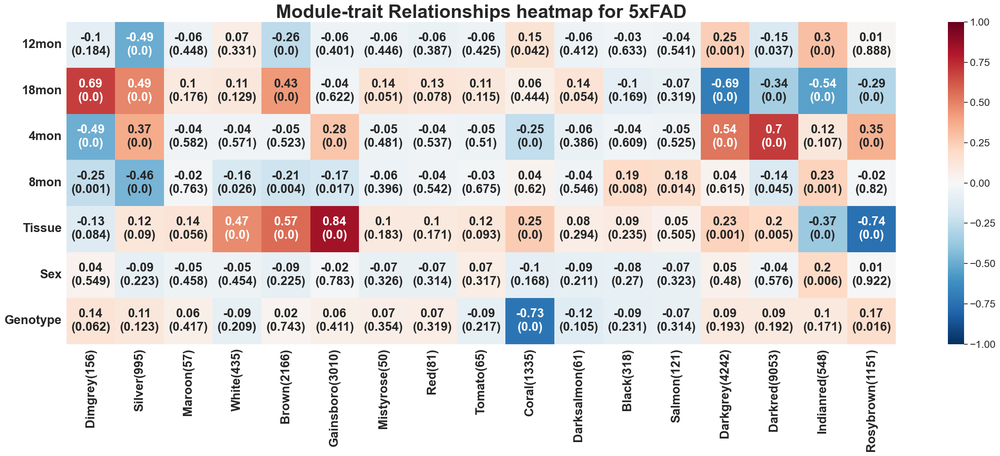

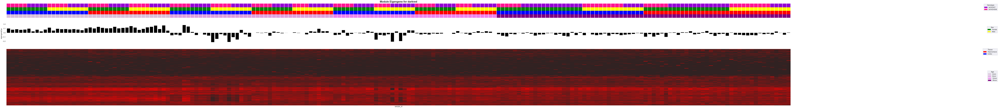

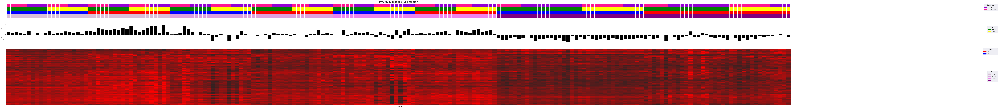

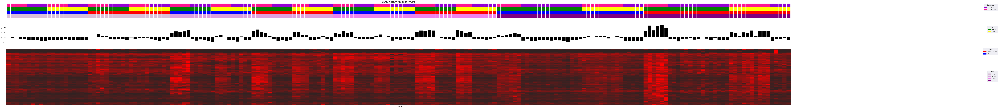

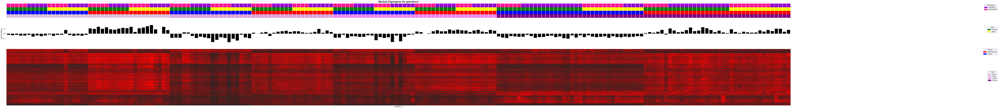

...

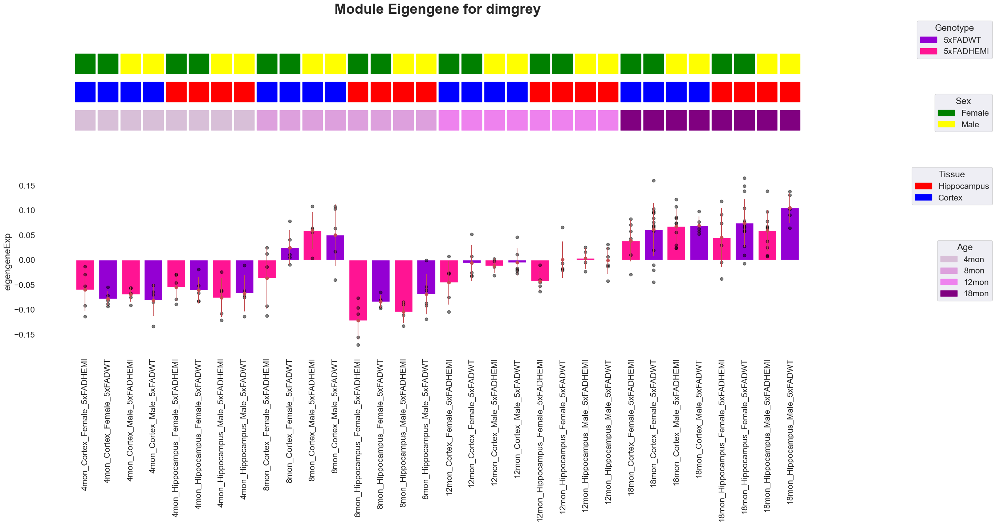

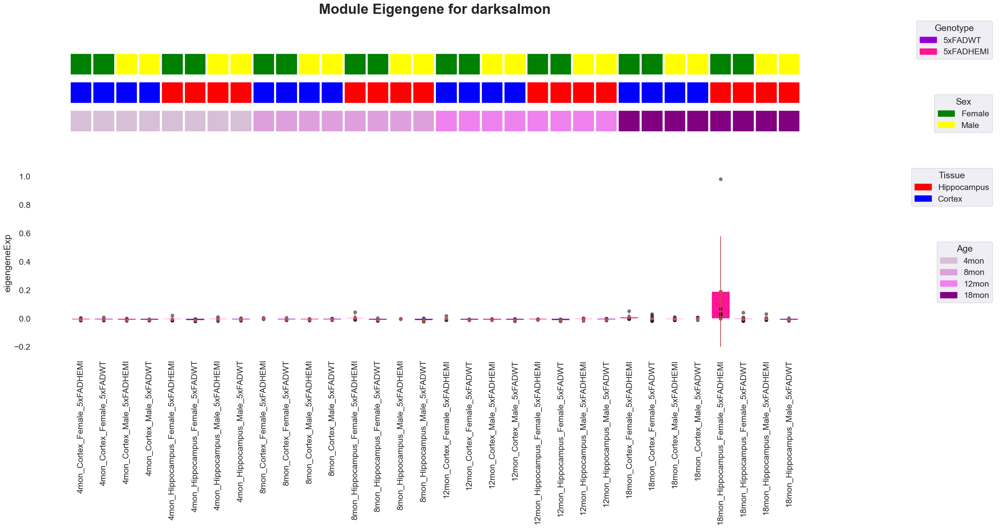

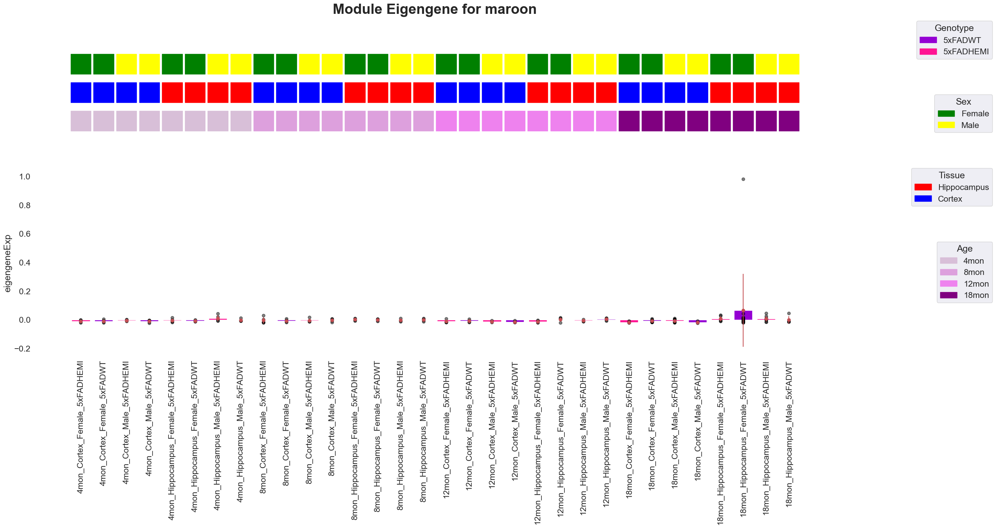

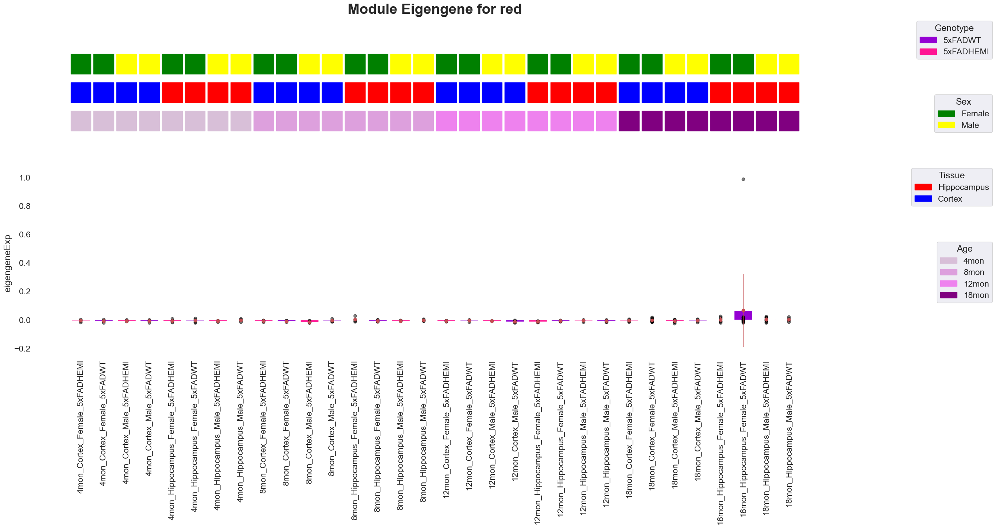

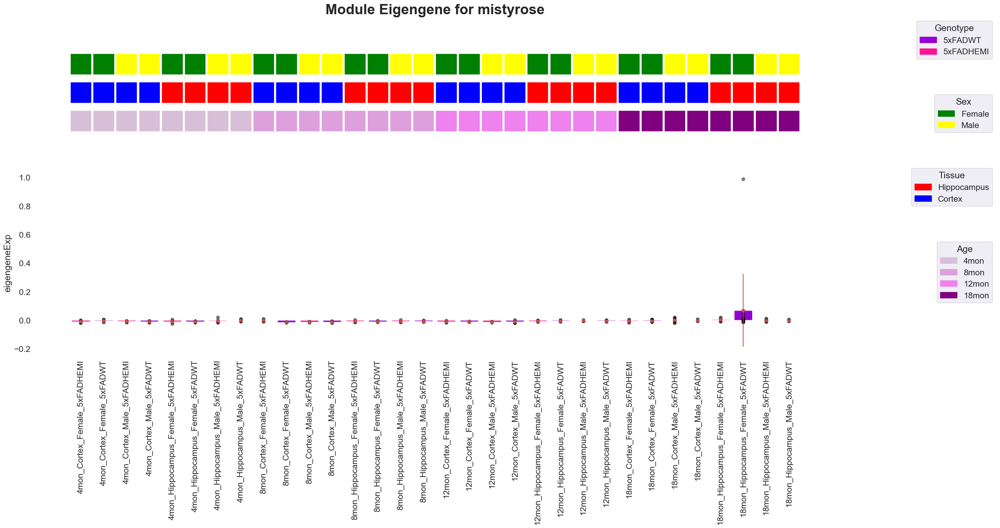

In [6]:
pyWGCNA_5xFAD.analyseWGCNA()

## Saving and loading your PyWGCNA
You can save or load your PyWGCNA object with the `saveWGCNA()` or `readWGCNA()` functions respectively.

In [7]:
pyWGCNA_5xFAD.saveWGCNA()

Saving WGCNA as 5xFAD.p


you can also load your PyWGCNA object with `readWGCNA()` function. you can download `5xFAD.p` from [Zendo](https://zenodo.org/record/6672453#.YrDS4LnMJhE).

In [1]:
import PyWGCNA
pyWGCNA_5xFAD = PyWGCNA.readWGCNA("5xFAD.p")

Reading 5xFAD WGCNA done!


## Finding hub genes for each modules

you can also ask about hub genes in each modules based on their connectivity by using `top_n_hub_genes()` function.

It will give you dataframe sorted by connectivity with additional gene information you have in your expression data.

In [8]:
pyWGCNA_5xFAD.top_n_hub_genes(moduleName="coral", n=10)

calculating adjacency matrix ...
	Done..



,connectivity,dynamicColors,moduleColors,moduleLabels,gene_name,gene_biotype
ENSMUSG00000036905,142.377574,coral,coral,2.0,C1qb,protein_coding
ENSMUSG00000038642,138.650424,coral,coral,2.0,Ctss,protein_coding
ENSMUSG00000021665,135.848008,coral,coral,2.0,Hexb,protein_coding
ENSMUSG00000036896,134.358788,coral,coral,2.0,C1qc,protein_coding
ENSMUSG00000000290,134.030810,coral,coral,2.0,Itgb2,protein_coding
ENSMUSG00000058715,132.936332,coral,coral,2.0,Fcer1g,protein_coding
ENSMUSG00000030124,131.812832,coral,coral,2.0,Lag3,protein_coding
ENSMUSG00000064267,130.008128,coral,coral,2.0,Hvcn1,protein_coding
ENSMUSG00000021423,129.823495,coral,coral,2.0,Ly86,protein_coding
ENSMUSG00000030798,128.650320,coral,coral,2.0,Cd37,protein_coding
